In [1]:
# !pip install seaborn

# import

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## read CSV Files

In [3]:
kkbox_df = pd.read_csv('./data/kkbox_data_not_log.csv')
kkbox_df

,Unnamed: 0,msno,city,bd,gender,registered_via,registration_init_time,is_churn,is_back,payment_plan_sum,plan_list_price,actual_amount_paid,discount_rate,is_auto_renew,membership_expire_date,is_cancel,transaction_count
0,0,+tJonkh+O1CA796Fm5X60UMOtB6POHAwPjbTRVl/EuU=,1,0,NaN,7,20110914,0,0,870,3981,4130,0.000000,1.0,20170428,0.033333,30
1,1,yLkV2gbZ4GLFwqTOXLVHz0VGrMYcgBGgKZ3kj9RiYu8=,4,30,male,9,20110916,0,0,603,2980,3129,0.000000,1.0,20170517,0.000000,21
2,2,WH5Jq4mgtfUFXh2yz+HrcTXKS4Oess4k4W3qKolAeb0=,5,34,male,9,20110916,1,0,360,1072,1072,0.000000,0.0,20170823,0.000000,2
3,3,I0yFvqMoNkM8ZNHb617e1RBzIS/YRKemHO7Wj13EtA0=,13,63,male,9,20110918,0,0,783,3874,4023,0.000000,1.0,20170426,0.000000,27
4,4,OoDwiKZM+ZGr9P3fRivavgOtglTEaNfWJO4KaJcTTts=,1,0,NaN,7,20110918,1,0,780,3874,4023,0.000000,1.0,20170427,0.000000,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
961426,961426,dz8iQV2eZCBZo1DjKL7OifsiyzGf3xyMaCFDOJHVeyc=,1,0,NaN,7,20151020,0,0,540,1782,1782,0.000000,1.0,20170419,0.000000,18
961427,961427,OL6joplCKThE1pZD+AQDnj3kZiC45qzpndlDIRSyPQI=,1,0,NaN,7,20151020,0,0,540,2682,2682,0.000000,1.0,20170420,0.000000,18
961428,961428,O11rAa17ANM6DGMMVb9L2vwCQFv/S6SR3SDB1nGuOAc=,1,0,NaN,7,20151020,0,0,540,1782,1782,0.000000,1.0,20170420,0.000000,18
961429,961429,tyoRqQ72Y2oCcqvdaIxG8T0Hs9DZvuuM8IeTwhxtdBQ=,6,26,female,7,20151020,0,0,570,2681,2532,0.052632,1.0,20170408,0.052632,19


In [4]:
kkbox_df.drop(['Unnamed: 0'], axis=1, inplace=True)

## 내가 관여할 컬럼 목록
- members.csv 참조

In [5]:
members_df = pd.read_csv('./data_z/members_v3.csv')
members_df.columns

Index(['msno', 'city', 'bd', 'gender', 'registered_via',
       'registration_init_time'],
      dtype='object')

**info()**

In [6]:
kkbox_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 961431 entries, 0 to 961430
Data columns (total 16 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   msno                    961431 non-null  object 
 1   city                    961431 non-null  int64  
 2   bd                      961431 non-null  int64  
 3   gender                  442069 non-null  object 
 4   registered_via          961431 non-null  int64  
 5   registration_init_time  961431 non-null  int64  
 6   is_churn                961431 non-null  int64  
 7   is_back                 961431 non-null  int64  
 8   payment_plan_sum        961431 non-null  int64  
 9   plan_list_price         961431 non-null  int64  
 10  actual_amount_paid      961431 non-null  int64  
 11  discount_rate           960376 non-null  float64
 12  is_auto_renew           961431 non-null  float64
 13  membership_expire_date  961431 non-null  int64  
 14  is_cancel           

**각 컬럼의 NaN 정도 찍어보기**

In [7]:
kkbox_df.isna().sum()

msno                           0
city                           0
bd                             0
gender                    519362
registered_via                 0
registration_init_time         0
is_churn                       0
is_back                        0
payment_plan_sum               0
plan_list_price                0
actual_amount_paid             0
discount_rate               1055
is_auto_renew                  0
membership_expire_date         0
is_cancel                      0
transaction_count              0
dtype: int64

**처리해야되는 컬럼 중 NaN인 것 하나임.**
- gender

In [8]:
kkbox_df['gender'].value_counts()

gender
male      232722
female    209347
Name: count, dtype: int64

### Data-Preprocessing
- bd 컬럼 -> Age 컬럼 컬럼명 변경
- gender 컬럼 결측치 처리
- gender 컬럼 LabelEncoder로 범주형 데이터(int64)로 변환
- registration_init_time 컬럼 Datetime 화

**bd 컬럼명 변경**

bd -> Age

In [9]:
kkbox_df.rename(columns={'bd': 'Age'}, inplace=True)

**gender 결측치 처리**

In [10]:
kkbox_df['gender'].value_counts(dropna=False)

gender
NaN       519362
male      232722
female    209347
Name: count, dtype: int64

In [11]:
kkbox_df['is_churn'].value_counts()

is_churn
0    837219
1    124212
Name: count, dtype: int64

In [12]:
# 성별 별 is_churn 비중
kkbox_df.groupby("gender")["is_churn"].value_counts(normalize=True).unstack()

is_churn,0,1
gender,,
female,0.827081,0.172919
male,0.826282,0.173718


In [13]:
# 비율을 유지하면서 각각 male, female로 결측치 처리

# gender가 NaN인 행을 is_churn별로 분리
nan_0_indices = kkbox_df[(kkbox_df["gender"].isna()) & (kkbox_df["is_churn"] == 0)].index
nan_1_indices = kkbox_df[(kkbox_df["gender"].isna()) & (kkbox_df["is_churn"] == 1)].index

# 랜덤하게 할당 (is_churn=0인 행)
np.random.seed(42)
kkbox_df.loc[nan_0_indices, "gender"] = np.random.choice(
    ["female", "male"], 
    size=len(nan_0_indices), 
    p=[0.827081, 1 - 0.827081]  # female 비율 적용
)

# 랜덤하게 할당 (is_churn=1인 행)
np.random.seed(42)
kkbox_df.loc[nan_1_indices, "gender"] = np.random.choice(
    ["female", "male"], 
    size=len(nan_1_indices), 
    p=[0.826282, 1 - 0.826282]  # female 비율 적용
)

**gender 라벨 처리**
- female: 0
- male: 1

In [14]:
from sklearn.preprocessing import LabelEncoder

enc = LabelEncoder()

# gender 컬럼을 변환하여 gender_enc 컬럼에 저장
kkbox_df["gender_enc"] = enc.fit_transform(kkbox_df["gender"])

In [15]:
cols = kkbox_df.columns.tolist()
cols.insert(4, cols.pop(cols.index("gender_enc")))
kkbox_df = kkbox_df[cols]

In [16]:
kkbox_df.head()

,msno,city,Age,gender,gender_enc,registered_via,registration_init_time,is_churn,is_back,payment_plan_sum,plan_list_price,actual_amount_paid,discount_rate,is_auto_renew,membership_expire_date,is_cancel,transaction_count
0,+tJonkh+O1CA796Fm5X60UMOtB6POHAwPjbTRVl/EuU=,1,0,female,0,7,20110914,0,0,870,3981,4130,0.0,1.0,20170428,0.033333,30
1,yLkV2gbZ4GLFwqTOXLVHz0VGrMYcgBGgKZ3kj9RiYu8=,4,30,male,1,9,20110916,0,0,603,2980,3129,0.0,1.0,20170517,0.000000,21
2,WH5Jq4mgtfUFXh2yz+HrcTXKS4Oess4k4W3qKolAeb0=,5,34,male,1,9,20110916,1,0,360,1072,1072,0.0,0.0,20170823,0.000000,2
3,I0yFvqMoNkM8ZNHb617e1RBzIS/YRKemHO7Wj13EtA0=,13,63,male,1,9,20110918,0,0,783,3874,4023,0.0,1.0,20170426,0.000000,27
4,OoDwiKZM+ZGr9P3fRivavgOtglTEaNfWJO4KaJcTTts=,1,0,female,0,7,20110918,1,0,780,3874,4023,0.0,1.0,20170427,0.000000,27


**registration_init_time 컬럼 Datetime화**

In [17]:
kkbox_df['registration_init_time'] = pd.to_datetime(kkbox_df['registration_init_time'].astype(str), format='%Y%m%d')

**최종 info**

In [18]:
kkbox_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 961431 entries, 0 to 961430
Data columns (total 17 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   msno                    961431 non-null  object        
 1   city                    961431 non-null  int64         
 2   Age                     961431 non-null  int64         
 3   gender                  961431 non-null  object        
 4   gender_enc              961431 non-null  int64         
 5   registered_via          961431 non-null  int64         
 6   registration_init_time  961431 non-null  datetime64[ns]
 7   is_churn                961431 non-null  int64         
 8   is_back                 961431 non-null  int64         
 9   payment_plan_sum        961431 non-null  int64         
 10  plan_list_price         961431 non-null  int64         
 11  actual_amount_paid      961431 non-null  int64         
 12  discount_rate           960376

## EDA
1. is_churn과 4가지 컬럼 상관관계
- Age, gender_enc, registered_via, registration_init_time, is_churn
2. 3가지컬럼 이상치 분석
- Age, registered_via, registration_init_time
3. 성별별 각 분포
- gender_enc / registered_via, registration_init_time, Age

1 번

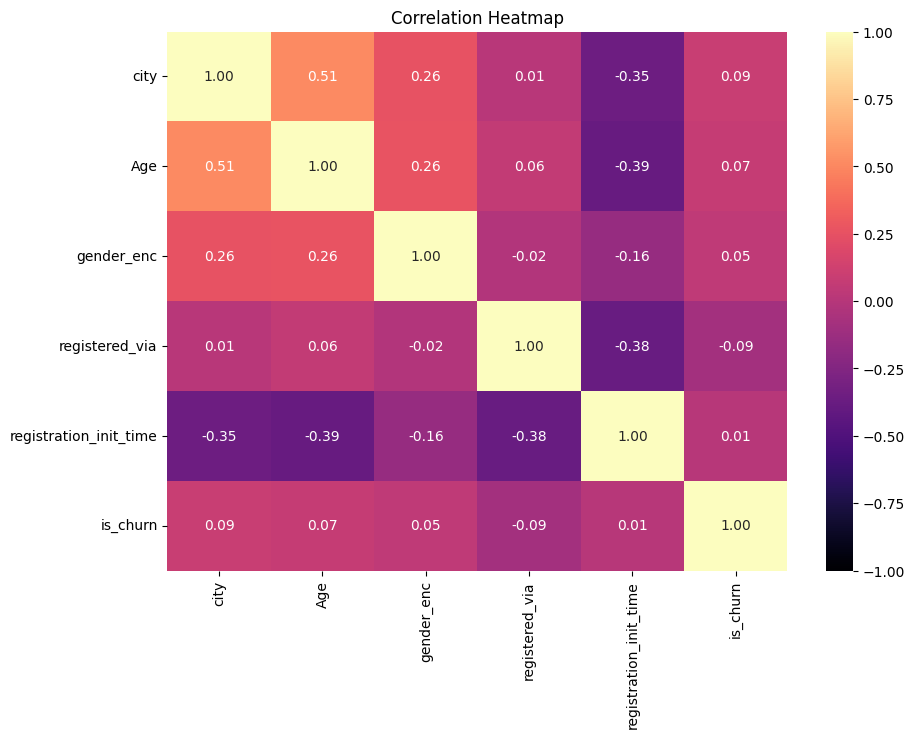

In [19]:
cols_to_check = ['city', 'Age', 'gender_enc', 'registered_via', 'registration_init_time', 'is_churn']
df_corr = kkbox_df[cols_to_check]

corr_matrix = df_corr.corr()

plt.figure(figsize=(10, 7))
sns.heatmap(corr_matrix, annot=True, cmap='magma', fmt='.2f', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()

2 번

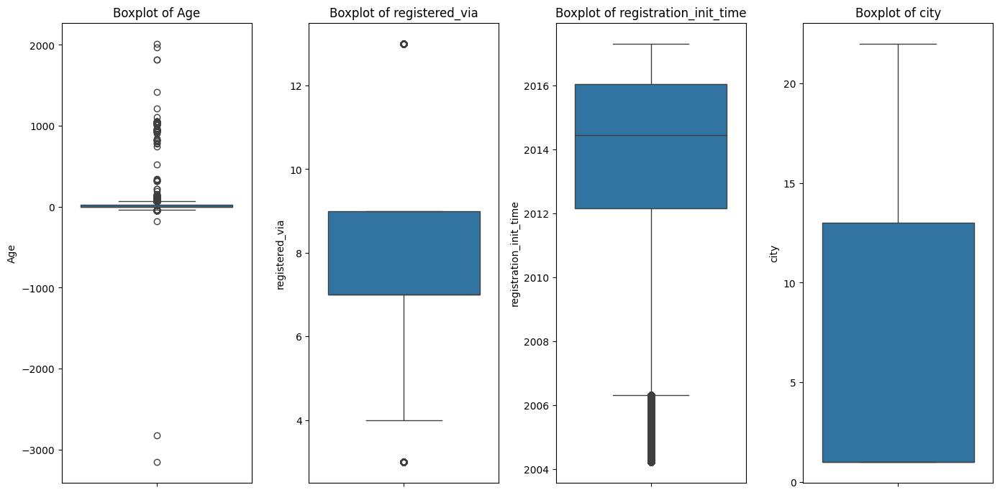

In [20]:
# Boxplot을 그릴 데이터 선택
cols_to_plot = ['Age', 'registered_via', 'registration_init_time', 'city']

plt.figure(figsize=(14, 7))

# 각 컬럼에 대해 Boxplot 그리기
for i, col in enumerate(cols_to_plot, 1):
    plt.subplot(1, 4, i)  # 1x3 그리드에 배치
    sns.boxplot(y=kkbox_df[col])
    plt.title(f'Boxplot of {col}')
    
plt.tight_layout()
plt.show()

In [21]:
kkbox_df['Age'].value_counts()

Age
 0       520495
 27       25456
 26       24417
 25       23338
 24       23075
          ...  
 130          1
-178          1
 942          1
 928          1
-3152         1
Name: count, Length: 236, dtype: int64

In [22]:
# registered_via
kkbox_df['registered_via'].unique()

array([ 7,  9,  3,  4, 13])

In [23]:
kkbox_df['city'].unique()

array([ 1,  4,  5, 13, 22, 14, 15,  3,  6, 10, 17, 11,  8,  9, 12, 18, 16,
       21,  7, 19, 20])

**결론**


Age: 나이가 비정상적으로 낮거나 높은 값들은 이상치로 간주되며, 이를 제거하거나 수정해야 할 필요가 있음

다른 이상치들은 특별한 문제는 없어보이며, 없는 값들을 데이터 세트를 만들때 적절한 값으로 매꾼것으로보임

3 번

C:\Users\Playdata\AppData\Local\Temp\ipykernel_19784\4047993384.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="gender", y="registered_via", data=kkbox_df, palette="muted")
C:\Users\Playdata\AppData\Local\Temp\ipykernel_19784\4047993384.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="gender", y="registration_init_time", data=kkbox_df, palette="muted")
C:\Users\Playdata\AppData\Local\Temp\ipykernel_19784\4047993384.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="gender", y="city", data=kkbox_df, palette="muted")


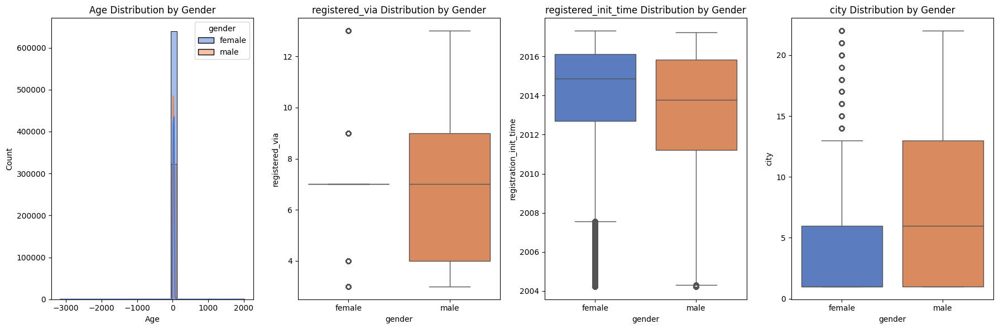

In [24]:
plt.figure(figsize=(18, 6))

# 1. Age 분포 시각화
plt.subplot(1, 4, 1)
sns.histplot(data=kkbox_df, x="Age", hue="gender", kde=True, bins=30, palette="muted")
plt.title('Age Distribution by Gender')

# 2. registered_via 분포 시각화
plt.subplot(1, 4, 2)
sns.boxplot(x="gender", y="registered_via", data=kkbox_df, palette="muted")
plt.title('registered_via Distribution by Gender')

# 3. registration_init_time 분포 시각화
plt.subplot(1, 4, 3)
sns.boxplot(x="gender", y="registration_init_time", data=kkbox_df, palette="muted")
plt.title('registered_init_time Distribution by Gender')

# 3. city 분포 시각화
plt.subplot(1, 4, 4)
sns.boxplot(x="gender", y="city", data=kkbox_df, palette="muted")
plt.title('city Distribution by Gender')

plt.tight_layout()
plt.show()


## 추가 전처리 :Age 컬럼
- 0 ~ 100 사이에 있지 않은 값을 이상치로 명시

In [25]:
outliers = kkbox_df[(kkbox_df["Age"] < 0) | (kkbox_df["Age"] > 100)]

print(f"이상치 개수: {len(outliers)}")

이상치 개수: 610


음수 -> 양수로 변경

In [26]:
kkbox_df["Age"] = kkbox_df["Age"].abs()

In [27]:
outliers = kkbox_df[(kkbox_df["Age"] < 0) | (kkbox_df["Age"] > 100)]
print(f"이상치 개수: {len(outliers)}")

이상치 개수: 536


중앙값으로 처리

In [28]:
age_median = kkbox_df["Age"].median()
age_median

np.float64(0.0)

In [29]:
kkbox_df['Age'].value_counts()

Age
0       520495
27       25456
26       24417
25       23338
24       23075
         ...  
132          1
178          1
942          1
928          1
3152         1
Name: count, Length: 211, dtype: int64

In [30]:
# 0인 값이 많아서 Age 중앙값이 0으로 나옴. 0보다 큰 Age 값의 중앙값

age_median_excluding_zero = kkbox_df[kkbox_df["Age"] > 0]["Age"].median()
age_median_excluding_zero

np.float64(28.0)

In [31]:
kkbox_df["Age"] = kkbox_df["Age"].apply(lambda x: age_median_excluding_zero if x < 0 or x > 100 else x)

In [32]:
kkbox_df['Age']

0          0.0
1         30.0
2         34.0
3         63.0
4          0.0
          ... 
961426     0.0
961427     0.0
961428     0.0
961429    26.0
961430     0.0
Name: Age, Length: 961431, dtype: float64

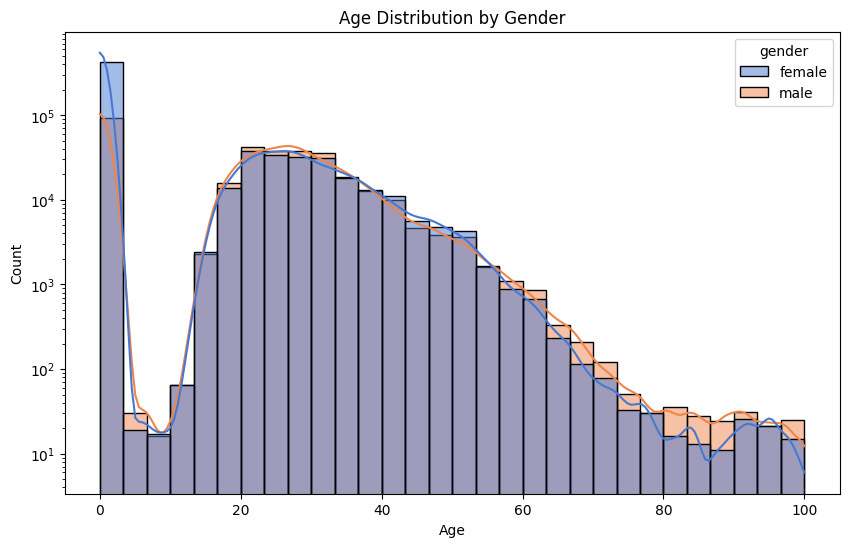

In [33]:
plt.figure(figsize=(10, 6))

# 1. Age 분포
sns.histplot(data=kkbox_df, x="Age", hue="gender", kde=True, bins=30, palette="muted")
plt.title('Age Distribution by Gender')

# scaling
plt.yscale('log')

plt.show()


In [34]:
# csv 생성
# kkbox_df.to_csv('./data/sw_datapreprocessing.csv', index=false)

# 번외
## Age 컬럼의 문제점
- 961431건 중 약 50000건의 데이터가 0

**제안방법**
예측 모델을 통해 0의 데이터 처리

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import lightgbm as lgb

# kkbox_sample_df는 기존 데이터를 복사한 것이라고 가정
kkbox_sample_df = kkbox_df.copy()

# 필요한 컬럼만 선택 (is_churn, gender_enc, city, Age)
model_data = kkbox_df[['is_churn', 'gender_enc', 'city', 'Age']]

# Age가 0인 값은 NaN으로 처리 (결측치: 예측값이 들어갈 부분)
model_data['Age'] = model_data['Age'].replace(0, np.nan)

# 결측값이 있는 행은 학습에 사용하지 않기 위해 제거
train_data = model_data.dropna(subset=['Age'])

# 학습용 데이터와 테스트용 데이터 나누기
X = train_data[['is_churn', 'gender_enc', 'city']]  # x
y = train_data['Age']  # y

# 학습용 데이터와 테스트용 데이터로 나누기 (80% 학습, 20% 테스트)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# LGBM 회귀 모델 초기화
model = lgb.LGBMRegressor()

# 모델 학습
model.fit(X_train, y_train)

# 테스트 데이터를 사용하여 예측
y_pred = model.predict(X_test)

# 모델 평가
mse = mean_squared_error(y_test, y_pred)  # 평균 제곱 오차
r2 = r2_score(y_test, y_pred)  # 결정 계수 (R2)

# 평가 결과 출력
print(f'Mean Squared Error: {mse}')
print(f'R2 Score: {r2}')

# 0인 Age 값을 예측하여 대체
kkbox_sample_df['Age'] = kkbox_sample_df.apply(
    lambda row: model.predict([[row['is_churn'], row['gender_enc'], row['city']]])[0] if row['Age'] == 0 else row['Age'],
    axis=1
)

# 예측 후 결과 확인
print(kkbox_sample_df['Age'].describe())

C:\Users\Playdata\AppData\Local\Temp\ipykernel_19784\2881135784.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  model_data['Age'] = model_data['Age'].replace(0, np.nan)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 26
[LightGBM] [Info] Number of data points in the train set: 352748, number of used features: 3
[LightGBM] [Info] Start training from score 29.646308
Mean Squared Error: 78.26822698296577
R2 Score: 0.025750788284489623


c:\Users\Playdata\AppData\Local\anaconda3\envs\2nd_project\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Playdata\AppData\Local\anaconda3\envs\2nd_project\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Playdata\AppData\Local\anaconda3\envs\2nd_project\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Playdata\AppData\Local\anaconda3\envs\2nd_project\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\Playdata\AppData\Local\anaconda3\envs\2nd_project\Lib\site-pack

다시 시각화

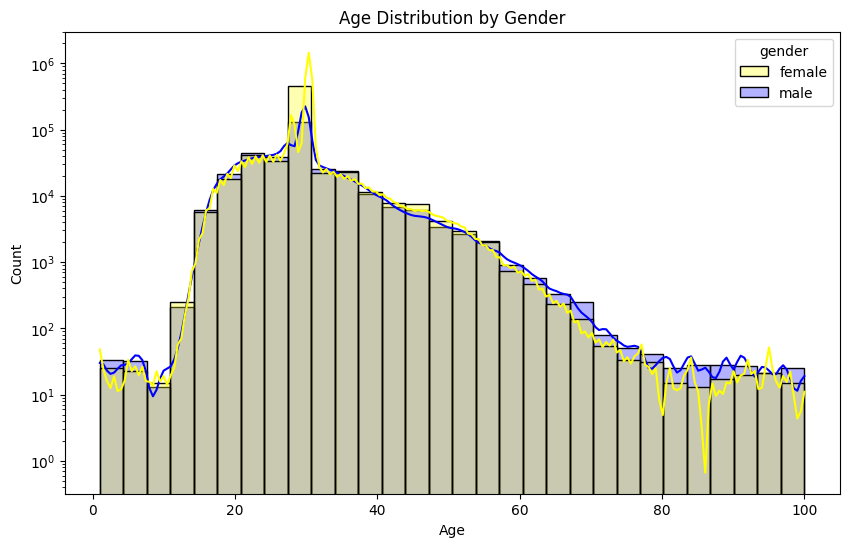

In [ ]:
plt.figure(figsize=(10, 6))

# 1. Age 분포
sns.histplot(data=kkbox_sample_df, x="Age", hue="gender", kde=True, bins=30, palette=["yellow", "blue"], alpha=0.3)
plt.title('Age Distribution by Gender')

# scaling
plt.yscale('log')

plt.show()


In [ ]:
# to csv
# kkbox_sample_df.to_csv('./data/sw_sample_datapreprocessing.csv', index=False)